# 🛣️ Network Analysis with Python: Shortest Path Exploration

In [18]:
# import for data manipulation
import geopandas as gpd
import numpy as np

# import for network data manipulation
import osmnx as ox
import networkx as nx

# visualization
from keplergl import KeplerGl
from IPython.display import IFrame

# import for geospatial data and projections
from pyproj import Transformer

In [2]:
MAIN_CRS = 'EPSG:32633'
WORLD_CRS = 'EPSG:4326'
FOLIUM_CRS = 'EPSG:3857'

### 1.a. 🕸️ **Collect street network data** of a city using Ouverture Maps Foundation

In [4]:
# import for ouverture
import duckdb

# import for geometry manipulation
from shapely.geometry import MultiPoint, LineString, GeometryCollection
from shapely.ops import split, snap


# if need to install 
# duckdb.sql('INSTALL httpfs;')
# Load duckdb extensions
duckdb.sql('LOAD spatial; LOAD httpfs;')

#### ⚙️ Logic to create the network from Ouverture Maps data
1. Get the city's boundaries geometry from [divisions](https://docs.overturemaps.org/guides/divisions/) layer - use type division_area
2. Get the road network data from [transportation](https://docs.overturemaps.org/guides/transportation/) layer - use type segment
3. Get the road connectors data from [transportation](https://docs.overturemaps.org/guides/transportation/) layer - use type connector  
4. Create a network component from the nodes and segments data 
    1. create a dictionary of all the nodes id:coordinates
    2. for each segments
        1. get the start and end node and create a node element if not exist
        2. each segment should be split between the nodes
        3. create an edge element with the start, end node and geometry
    3. filter out non drivable segments

In [5]:
# create a connection to the s3 bucket, with the lastest version of the data
repo_version = "s3://overturemaps-us-west-2/release/2024-11-13.0"

#### 🌆 City boundaries used to filter the roads

In [6]:
# get Graz city boundaries from Ouverture Maps
# you can explore the data in the s3 bucket using the Ouverture Maps web explorer: https://explore.overturemaps.org/#11.1/47.0775/15.4233

# create query to get Graz city boundaries
query = f"""
    SELECT
        -- get only the columns that we need
        id, country, names, version, population, ST_AsHexWKB(geometry) as geometry, bbox
    FROM
        -- you can read a parquet file directly from a s3 bucket 😍
        -- union by name will merge the columns with the same name allow to avoid duplicates
        -- hive_partitioning will create a column with the partition allow to optimize the query

        read_parquet("{repo_version}/theme=divisions/type=division_area/*", union_by_name = true, hive_partitioning = true)
    WHERE
        -- the name columns in a json object, so we need to extract it
        names.primary = 'Graz'
"""

df_graz = duckdb.sql(query).df()
gdf_graz = gpd.GeoDataFrame(df_graz, crs=WORLD_CRS, geometry=gpd.GeoSeries.from_wkb(df_graz.geometry))
gdf_graz.head()


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,id,country,names,version,population,geometry,bbox
0,0857c8073fffffff01d1083141a2d087,AT,"{'primary': 'Graz', 'common': {'de': 'Graz', '...",0,NaN,"POLYGON ((15.35093 47.10129, 15.35083 47.10120...","{'xmin': 15.349712371826172, 'xmax': 15.534200..."


(1, 7)
Index(['id', 'country', 'names', 'version', 'population', 'geometry', 'bbox'], dtype='object')


<Axes: >

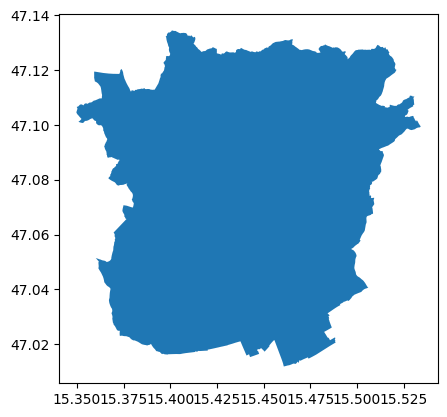

In [7]:
# explore the geodataframe
print(gdf_graz.shape)
print(gdf_graz.columns)

gdf_graz.plot()

#### 🛣️ Collect road segments based on the boundary extend and bbox

In [8]:
# Get the road network of Graz from bounding box of Graz city boundaries

query = f"""
    SELECT
        -- get only the columns that we need
        id, version, subtype, class, subclass, speed_limits, connectors, ST_AsHexWKB(geometry) as geometry
    FROM
        read_parquet("{repo_version}/theme=transportation/type=segment/*", union_by_name = true, hive_partitioning=true)
    WHERE 
        -- the subtype is important here to collect only the road network
        subtype = 'road'
        -- filter by the bounding box of Graz city boundaries
        AND bbox.xmin >= {gdf_graz.bbox[0]['xmin']} AND bbox.xmax <= {gdf_graz.bbox[0]['xmax']}
        AND bbox.ymin >= {gdf_graz.bbox[0]['ymin']} AND bbox.ymax <= {gdf_graz.bbox[0]['ymax']}
        -- refine the filter by the geometry of Graz city boundaries 
        AND ST_intersects(geometry, ST_GeomFromText('{gdf_graz.geometry[0]}'))
"""

df_roads = duckdb.sql(query).df()
gdf_roads = gpd.GeoDataFrame(df_roads, crs=WORLD_CRS, geometry=gpd.GeoSeries.from_wkb(df_roads.geometry))
gdf_roads.head()

FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,id,version,subtype,class,subclass,speed_limits,connectors,geometry
0,0871e10aa2ffffff04767d48462e60d5,0,road,residential,None,"[{'min_speed': None, 'max_speed': {'value': 30...",[{'connector_id': '08f1e10a84930d8e0474f456857...,"LINESTRING (15.37814 47.01970, 15.37804 47.019..."
1,08a1e10aa228ffff0477759c39a99912,0,road,service,driveway,NaN,[{'connector_id': '08f1e10aa228961e047dffa3cc7...,"LINESTRING (15.38012 47.02145, 15.37986 47.021..."
2,0881e10a849fffff047474e9313fb9ca,0,road,footway,None,NaN,[{'connector_id': '08f1e10aa22db166047c7f1b801...,"LINESTRING (15.38318 47.02071, 15.38308 47.020..."
3,0871e10aa2ffffff04767dc115aafa31,0,road,unclassified,None,NaN,[{'connector_id': '08f1e10aa228c8930474ff75124...,"LINESTRING (15.37892 47.02205, 15.37897 47.022..."
4,0871e10aa2ffffff0474f4d2395548d7,0,road,path,None,"[{'min_speed': None, 'max_speed': {'value': 30...",[{'connector_id': '08f1e10aa22d95850474751c25c...,"LINESTRING (15.38320 47.02091, 15.38286 47.021..."


(35602, 8)
Index(['id', 'version', 'subtype', 'class', 'subclass', 'speed_limits',
       'connectors', 'geometry'],
      dtype='object')


<Axes: >

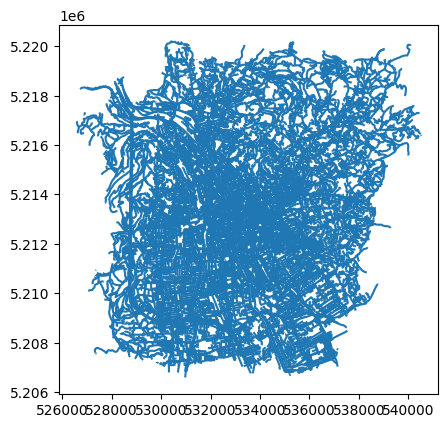

In [9]:
# explore the dataframe
print(gdf_roads.shape)
print(gdf_roads.columns)

gdf_roads = gdf_roads.to_crs(MAIN_CRS)

gdf_roads.plot()

#### 📌 Collect the connectors to recreate and divide the road segments

In [10]:
# get connectors (nodes) of the road network of Graz from bounding box of Graz city boundaries

query = f"""
    SELECT
        -- get only the columns that we need
        id, version, ST_AsHexWKB(geometry) as geometry
    FROM
        read_parquet("{repo_version}/theme=transportation/type=connector/*", union_by_name = true, hive_partitioning=true)
    WHERE 
        -- filter by the bounding box of Graz city boundaries            
        bbox.xmin >= {gdf_graz.bbox[0]['xmin']} AND bbox.xmax <= {gdf_graz.bbox[0]['xmax']}
        AND bbox.ymin >= {gdf_graz.bbox[0]['ymin']} AND bbox.ymax <= {gdf_graz.bbox[0]['ymax']}
        -- we have a bigger extend here to be sure to get all needed connectors
"""

df_road_nodes = duckdb.sql(query).df()
gdf_road_nodes = gpd.GeoDataFrame(df_road_nodes, crs=WORLD_CRS, geometry=gpd.GeoSeries.from_wkb(df_road_nodes.geometry))
gdf_road_nodes.head()


FloatProgress(value=0.0, layout=Layout(width='auto'), style=ProgressStyle(bar_color='black'))

,id,version,geometry
0,08f1e10ab18710240476fc8ad165a3df,0,POINT (15.35326 47.01595)
1,08f1e10ab1b8c1a00477f3446fa92c53,0,POINT (15.35801 47.01311)
2,08f1e10ab1b89d14047d7d63d004a02d,0,POINT (15.35882 47.01284)
3,08f1e10ab1bb086c047475d3ed95ffb5,0,POINT (15.35513 47.01353)
4,08f1e10ab1ba4442047674f3447eb714,0,POINT (15.35594 47.01440)


(71306, 3)
Index(['id', 'version', 'geometry'], dtype='object')


<Axes: >

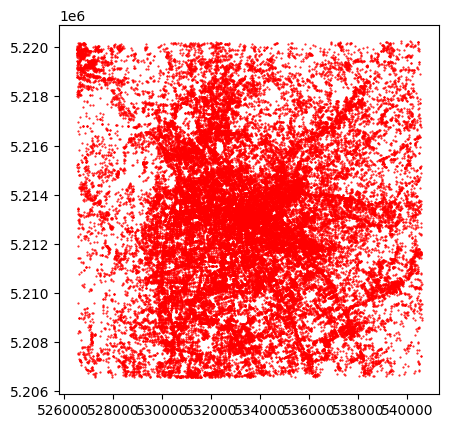

In [11]:
# explore the dataframe
print(gdf_road_nodes.shape)
print(gdf_road_nodes.columns)

gdf_road_nodes = gdf_road_nodes.to_crs(MAIN_CRS)


gdf_road_nodes.plot(marker='.', color='red', markersize=1)

#### 👷🏻 Create the network from connectors and segments 

In [12]:
# 👀 let's look at segments and how they are structures with connectors
list(gdf_roads.connectors)[:5]

[array([{'connector_id': '08f1e10a84930d8e0474f45685702669', 'at': 0.0},
        {'connector_id': '08f1e10aa229ac4904767643d323d97c', 'at': 0.224760047},
        {'connector_id': '08f1e10aa22810e8047f7462b33b5346', 'at': 0.90385175},
        {'connector_id': '08f1e10aa228c8930474ff75124efb62', 'at': 1.0}],
       dtype=object),
 array([{'connector_id': '08f1e10aa228961e047dffa3cc7c0e9f', 'at': 0.0},
        {'connector_id': '08f1e10aa228b8da04747595289edc75', 'at': 1.0}],
       dtype=object),
 array([{'connector_id': '08f1e10aa22db166047c7f1b8012534a', 'at': 0.0},
        {'connector_id': '08f1e10a8492d26a0475f5f3877716e6', 'at': 0.289738974},
        {'connector_id': '08f1e10a8490ead2047c77d59453c7f7', 'at': 1.0}],
       dtype=object),
 array([{'connector_id': '08f1e10aa228c8930474ff75124efb62', 'at': 0.0},
        {'connector_id': '08f1e10aa2288a810475f58dc1985fbe', 'at': 0.193790785},
        {'connector_id': '08f1e10aa228961e047dffa3cc7c0e9f', 'at': 0.339732585},
        {'connec

In [13]:
# helper functions
def create_node(G, node, geometry):
    """
    Create a node in the graph G with the node id and geometry
    """
    # check if node exists
    if node not in G.nodes:
        # add node to the graph
        G.add_node(node, x=geometry.x, y=geometry.y)
    return # nothing to return

In [14]:
# We want only the segment that are drivable
# let's filter the graph to select only driving roads
gdf_roads['class'].unique() 

array(['residential', 'service', 'footway', 'unclassified', 'path',
       'track', 'primary', 'cycleway', 'secondary', 'motorway',
       'living_street', 'steps', 'tertiary', 'pedestrian', 'unknown',
       'bridleway'], dtype=object)

In [32]:
# create empty graph with the same projection as the geodataframe
# needs to be a MultiGraph to work with osmnx
G = nx.MultiGraph(crs=MAIN_CRS)

# list of accepted tags = drivable
drive_types = {'residential', 'unclassified', 'primary', 'secondary', 
                 'motorway', 'tertiary', 'unknown'}

# get a dictionary of connectors format {connector_id: geometry}
connector_dict = gdf_road_nodes.set_index('id')['geometry'].to_dict()

# loop on all road segments to create the related edges + nodes
for idx, road in gdf_roads.iterrows():
    
    # keep only the road segments that are drivable 
    if road['class'] not in drive_types:
        continue

    # get all connectors of the road segment
    connector_ids = [conn['connector_id'] for conn in road['connectors']]
    
    # save the geometry of the segment, we will need it
    seg_geom = road['geometry']

    # loop on the connectors of the segment to create the edges and nodes
    # we start at index 1 because the first connector is the start of the segment
    # an edge is created between the current connector and the previous one
    for i in range(1, len(connector_ids)):
        # beginning and end nodes - connectors
        start_cid = connector_ids[i-1]
        create_node(G, start_cid, connector_dict[start_cid])
        end_cid = connector_ids[i]
        create_node(G, end_cid, connector_dict[end_cid])
        
        # create edges between the connectors
        # the geometry of the segment should be split at the connectors
        # split takes the geometry of the segment and the connector geometry
        # split returns a collection of geometries, we need to get the last one
        collection_geoms = split(seg_geom, connector_dict[end_cid])
        arr_line_geoms = [geom for geom in collection_geoms.geoms]
        # we update the geometry of the segment with the rest of the geometry
        seg_geom = arr_line_geoms[len(arr_line_geoms)-1]

        # Create an edge with its attributes
        G.add_edge(
            # start node
            start_cid,
            # end node
            end_cid,
            id = road.id,
            # need a "key" because it is used by osmnx
            key=f'{start_cid}_{end_cid}',
            # add the geometry of the segment
            geometry=arr_line_geoms[0],
            length=arr_line_geoms[0].length,
            # add the type of the road
            type=road['class']
        )

/Users/thibaudchassin/Graz/Projects/Classes/.venv/lib/python3.12/site-packages/shapely/linear.py:88: RuntimeWarning: invalid value encountered in line_locate_point
  return lib.line_locate_point(line, other)


### 1.b. 🕸️ **Collect street network data** of a city using OSMnx

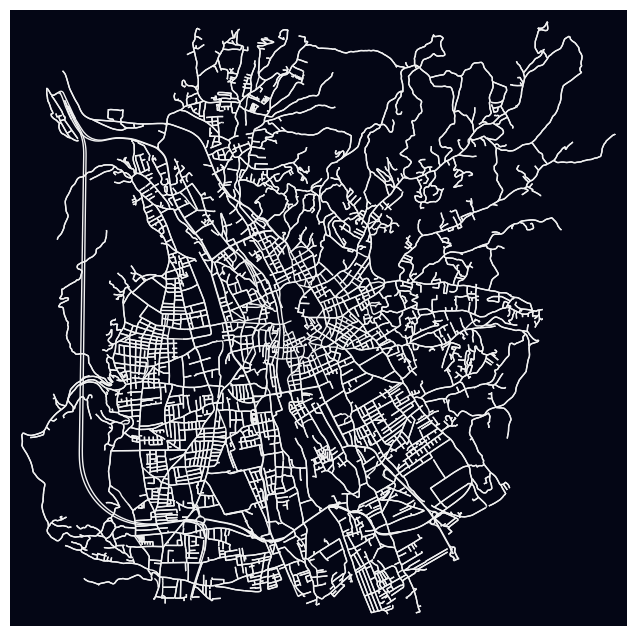

In [3]:
city = "Graz, Austria"

# download the road network of Graz
G = ox.graph_from_place(city, network_type='drive', simplify= True)
# a network is often represented by G 

G = ox.project_graph(G, to_crs=MAIN_CRS)
# plot the network
fig, ax = ox.plot_graph(G, node_size=0, bgcolor= "#040615", edge_color='#f1f1f1')

### 1. 👀 Visualize the network and its data

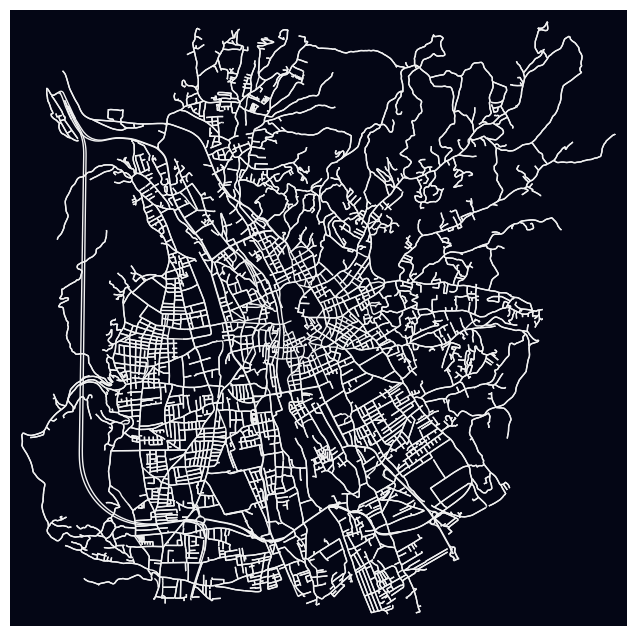

In [4]:
# plot the network
fig, ax = ox.plot_graph(G, node_size=0, bgcolor= "#040615", edge_color='#f1f1f1')

In [ ]:

# create an interactive map with Kepler

# create map 
kepler_map = KeplerGl()

gdf_roads = ox.graph_to_gdfs(G, nodes=False).to_crs(FOLIUM_CRS).dropna(subset=['geometry']).reset_index()
gdf_roads = gdf_roads.replace({np.nan: None})

# center the map on the data
kepler_map.config['mapState'] = {
            'latitude': gdf_roads.iloc[0].geometry.centroid.y,
            'longitude': gdf_roads.iloc[0].geometry.centroid.y,
            'zoom': 10
}

# Add data to the map
kepler_map.add_data(data= gdf_roads, name='roads_graz')

# save to html
kepler_map.save_to_html(file_name='explore_map.html', config=kepler_map.config)

# Visualize the map in a div
IFrame(src='./explore_map.html', width=800, height=800)

In [17]:
# explore the graph with folium
ox.graph_to_gdfs(G, nodes=False).to_crs(FOLIUM_CRS).explore()

In [20]:
# Verify the network was created
print(f"Number of nodes: {G.number_of_nodes()}")
print(f"Number of edges: {G.number_of_edges()}")

Number of nodes: 4775
Number of edges: 11320


In [ ]:
# 👀 to visualize the data your can use a for loop
for u, v, data in G.edges(data=True):
    print(u, v, data)

### 2. 📍 **Geocode** a source address and a target address

In [22]:
# crs transformation function
def to_crs(x, y, target_crs, source_crs):
    transformer = Transformer.from_crs(source_crs, target_crs)
    return transformer.transform(x, y)

##### 🟢 Source

In [23]:
source_address = "Hauptbahnhof, 8020 Graz, Austria"

# geocode & reproject the address
xsource_4326, ysource_4326 = ox.geocode(source_address)
xsource_32633, ysource_32633 = to_crs(xsource_4326, ysource_4326, MAIN_CRS, WORLD_CRS)

print(f"coordinates of the source {xsource_32633, ysource_32633}")


coordinates of the source (531653.7888715944, 5213443.897936141)


##### 🔴 Target

In [24]:
target_address = "Heinrichstrasse 36, 8010 Graz"

# geocode & reproject the address
xtarget_4326, ytarget_4326 = ox.geocode(target_address)
xtarget_32633, ytarget_32633 = to_crs(xtarget_4326, ytarget_4326, MAIN_CRS, WORLD_CRS)

print(f"coordinates of the target {xtarget_32633, ytarget_32633}")


coordinates of the target (534039.3133922248, 5214041.155042129)


### 3. 🍒 **Select** the related nodes in the graph

##### 🟢 Source

In [25]:
source_nodes, distance_to_source = ox.nearest_nodes(G, X=[xsource_32633], Y=[ysource_32633], return_dist=True)

# get the nearest node to the source, select the first element of the list
source_node = source_nodes[0]

print(f"node selected for source is {source_node}, with a distance of {round(distance_to_source[0],1)} meters")

node selected for source is 25703785, with a distance of 101.9 meters


##### 🔴 Target

In [26]:
target_nodes, distance_to_target = ox.nearest_nodes(G, X=[xtarget_32633], Y=[ytarget_32633], return_dist=True)

# get the nearest node to the source, select the first element of the list
target_node = target_nodes[0]

print(f"node selected for target is {target_node}, with a distance of {round(distance_to_target[0],1)} meters")

node selected for target is 21315339, with a distance of 35.5 meters


### 4. 🐇 **Calculate** the shortest path between the two points using Dijkstra's algorithm

In [27]:
shortest_path_d = nx.dijkstra_path(G, source=source_node, target=target_node, weight='length')
length_path_d = nx.dijkstra_path_length(G, source=source_node, target=target_node, weight='length')

print(f"Shortest path as a distance of {round(length_path_d,2)} meters")

Shortest path as a distance of 2576.15 meters



### 5. 👀 **Visualize** the route on a map

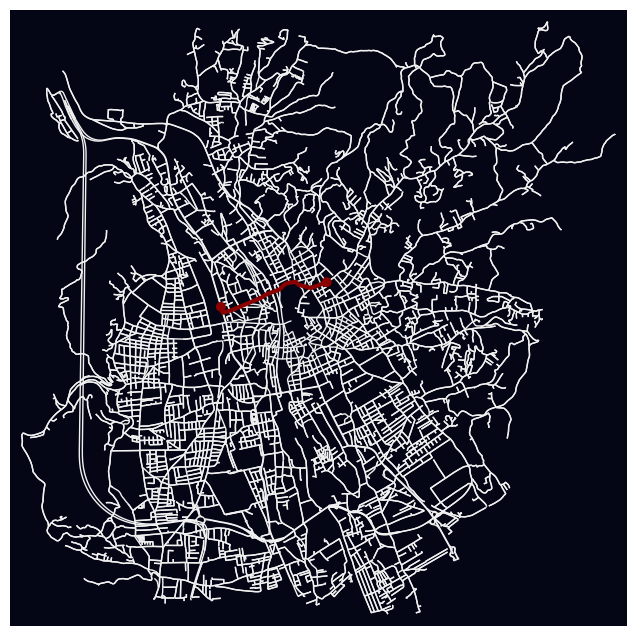

In [28]:
fig, ax = ox.plot_graph_route(G, shortest_path_d, node_size=0, route_alpha=1, orig_dest_size=50, edge_color='#f1f1f1', route_color='darkred', route_linewidth=3, **{'node_color':'r', 'bgcolor':"#040615"})

### 🎲 Random Routes

/tmp/ipykernel_151/1754164032.py:2: UserWarning: graph should be undirected to avoid oversampling bidirectional edges
  orig = ox.utils_geo.sample_points(G, 1).index[0][0]
/tmp/ipykernel_151/1754164032.py:3: UserWarning: graph should be undirected to avoid oversampling bidirectional edges
  dest = ox.utils_geo.sample_points(G, 1).index[0][0]


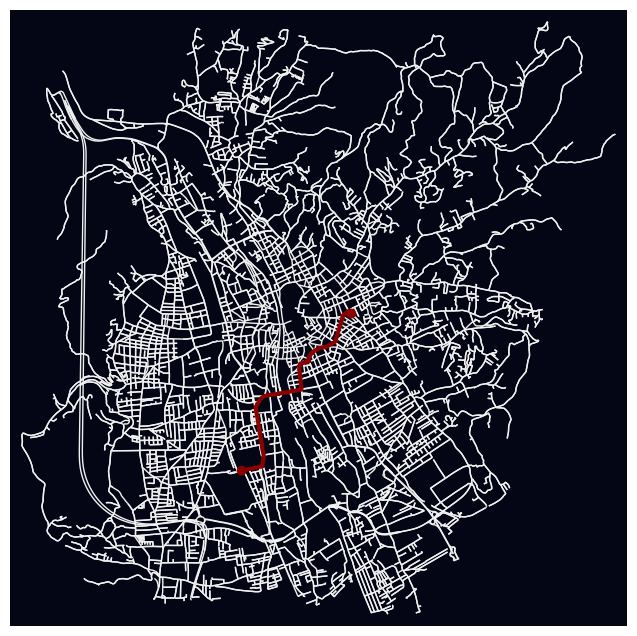

In [29]:
# create a random location path generator 
orig = ox.utils_geo.sample_points(G, 1).index[0][0]
dest = ox.utils_geo.sample_points(G, 1).index[0][0]
route = nx.dijkstra_path(G, source=orig, target=dest, weight='length')
fig, ax = ox.plot_graph_route(G, route, node_size=0, route_alpha=1, orig_dest_size=50, edge_color='#f1f1f1', route_color='darkred', route_linewidth=3, **{'node_color':'r', 'bgcolor':"#040615"} )